In [1]:
from __future__ import absolute_import, division, print_function, unicode_literals
import tensorflow as tf
import tensorflow.keras as keras
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2' 
os.environ['TF_ENABLE_AUTO_MIXED_PRECISION'] = '1'
import string
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import PIL
import random
import time
from pathlib import Path

import re
from IPython import display

from transformers import TFAutoModel, AutoTokenizer
from tqdm import tqdm

/home/dala/anaconda3/envs/tf_env/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        # Restrict TensorFlow to only use the first GPU
        tf.config.experimental.set_visible_devices(gpus[0], 'GPU')

        # Currently, memory growth needs to be the same across GPUs
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Memory growth must be set before GPUs have been initialized
        print(e)


1 Physical GPUs, 1 Logical GPUs


In [3]:
dictionary_path = '/media/dala/SD480G/comp3/dataset/dictionary'
vocab = np.load(dictionary_path + '/vocab.npy')
print('there are {} vocabularies in total'.format(len(vocab)))

word2Id_dict = dict(np.load(dictionary_path + '/word2Id.npy'))
id2word_dict = dict(np.load(dictionary_path + '/id2Word.npy'))
print('Word to id mapping, for example: %s -> %s' % ('flower', word2Id_dict['flower']))
print('Id to word mapping, for example: %s -> %s' % ('1', id2word_dict['1']))
print('Tokens: <PAD>: %s; <RARE>: %s' % (word2Id_dict['<PAD>'], word2Id_dict['<RARE>']))


there are 5427 vocabularies in total
Word to id mapping, for example: flower -> 1
Id to word mapping, for example: 1 -> flower
Tokens: <PAD>: 5427; <RARE>: 5428


In [4]:
def sent2IdList(line, MAX_SEQ_LENGTH=20):
    MAX_SEQ_LIMIT = MAX_SEQ_LENGTH
    padding = 0
    
    # data preprocessing, remove all puntuation in the texts
    prep_line = re.sub('[%s]' % re.escape(string.punctuation), ' ', line.rstrip())
    prep_line = prep_line.replace('-', ' ')
    prep_line = prep_line.replace('-', ' ')
    prep_line = prep_line.replace('  ', ' ')
    prep_line = prep_line.replace('.', '')
    tokens = prep_line.split(' ')
    tokens = [
        tokens[i] for i in range(len(tokens))
        if tokens[i] != ' ' and tokens[i] != ''
    ]
    l = len(tokens)
    padding = MAX_SEQ_LIMIT - l
    
    # make sure length of each text is equal to MAX_SEQ_LENGTH, and replace the less common word with <RARE> token
    for i in range(padding):
        tokens.append('<PAD>')
    line = [
        word2Id_dict[tokens[k]]
        if tokens[k] in word2Id_dict else word2Id_dict['<RARE>']
        for k in range(len(tokens))
    ]

    return line

text = "the flower shown has yellow anther red pistil and bright red petals."
print(text)
print(sent2IdList(text))


the flower shown has yellow anther red pistil and bright red petals.
['9', '1', '82', '5', '11', '70', '20', '31', '3', '29', '20', '2', '5427', '5427', '5427', '5427', '5427', '5427', '5427', '5427']


In [5]:
def sent2WordList(caption):
    return ' '.join(id2word_dict[str(i)] \
                    for i in caption \
                    if str(i) in id2word_dict and id2word_dict[str(i)][0] != '<')

In [6]:
print(sent2WordList(sent2IdList(text)))

the flower shown has yellow anther red pistil and bright red petals


# Text Encoder

In [7]:
class TFSentenceTransformer(keras.layers.Layer):
    def __init__(self, model_name):
        super().__init__()
        self.model = TFAutoModel.from_pretrained(model_name)

    def call(self, inputs, normalize=True):
        model_output = self.model(inputs)
        embeddings = self.mean_pooling(model_output, inputs['attention_mask'])
        if normalize:
            embeddings = self.normalize(embeddings)
        return embeddings

    def mean_pooling(self, model_output, attention_mask):
        token_embeddings = model_output[0]
        input_mask_expanded = tf.cast(
            tf.broadcast_to(tf.expand_dims(attention_mask, -1), tf.shape(token_embeddings)),
            tf.float32
        )
        return tf.math.reduce_sum(token_embeddings * input_mask_expanded, axis=1) \
                / tf.clip_by_value(tf.math.reduce_sum(input_mask_expanded, axis=1), 1e-9, tf.float32.max)

    def normalize(self, embeddings):
        embeddings, _ = tf.linalg.normalize(embeddings, 2, axis=1)
        return embeddings


class E2ESentenceTransformer(keras.Model):
    def __init__(self, model_name):
        super().__init__(name='text_encoder')
#         self.tokenizer = TFBertTokenizer.from_pretrained(model_name)
        self.tokenizer = AutoTokenizer.from_pretrained(model_name)
        self.model = TFSentenceTransformer(model_name)

    def call(self, inputs):
#         tokenized = self.tokenizer(inputs)
        tokenized = self.tokenizer(inputs, padding=True, truncation=True, return_tensors='tf')
        return self.model(tokenized)


# Generator

In [8]:
class Generator(keras.Model):
    def __init__(self, input_z_shape, emb_shape):
        super().__init__(name='generator')
        self.input_z_shape = input_z_shape
        self.emb_shape = emb_shape
        self.text = keras.Sequential([
            keras.layers.Flatten(), 
            keras.layers.Dense(384), 
            keras.layers.BatchNormalization(), 
            keras.layers.LeakyReLU(), 
        ])
        self.generator = keras.Sequential([
            keras.layers.Dense(8192, use_bias=False), 
            keras.layers.Reshape((4, 4, 512)), 
    
            keras.layers.Conv2DTranspose(
                512, 
                (4, 4), 
                strides=(1, 1), 
                padding='same', 
                use_bias=False, 
                kernel_initializer=keras.initializers.RandomNormal(mean=0.0, stddev=0.02), 
            ), 
            keras.layers.BatchNormalization(), 
            keras.layers.LeakyReLU(), 

            keras.layers.Conv2DTranspose(
                256, 
                (4, 4), 
                strides=(2, 2), 
                padding='same', 
                use_bias=False, 
                kernel_initializer=keras.initializers.RandomNormal(mean=0.0, stddev=0.02), 
            ), 
            keras.layers.BatchNormalization(), 
            keras.layers.LeakyReLU(), 
            keras.layers.Conv2DTranspose(
                128, 
                (4, 4), 
                strides=(2, 2), 
                padding='same', 
                use_bias=False, 
                kernel_initializer=keras.initializers.RandomNormal(mean=0.0, stddev=0.02), 
            ), 
            keras.layers.BatchNormalization(), 
            keras.layers.LeakyReLU(), 

            keras.layers.Conv2DTranspose(
                64, 
                (4, 4), 
                strides=(2, 2), 
                padding='same', 
                use_bias=False, 
                kernel_initializer=keras.initializers.RandomNormal(mean=0.0, stddev=0.02), 
            ), 
            keras.layers.BatchNormalization(), 
            keras.layers.LeakyReLU(), 

            keras.layers.Conv2DTranspose(
                3, 
                (4, 4), 
                strides=(2, 2), 
                padding='same', 
                use_bias=False, 
                activation='tanh', 
                kernel_initializer=keras.initializers.RandomNormal(mean=0.0, stddev=0.02), 
            ), 
        ])
        
    def call(self, text, noise_z):
        text = self.text(text)
        text_concat = tf.concat([noise_z, text], axis=1)
        output = self.generator(text_concat)
        return output

    def summary(self):
        text = keras.layers.Input(shape=(self.emb_shape, ), name='text')
        noise_z = keras.layers.Input(shape=(self.input_z_shape, ), name='noise_z')
        model = keras.Model(name='generator', inputs=[text, noise_z], outputs=self.call(text, noise_z))
        return model.summary()


# Discriminator

In [9]:
class Discriminator(keras.Model):
    def __init__(self, input_x_shape, emb_shape):
        super().__init__(name='generator')
        self.input_x_shape = input_x_shape
        self.emb_shape = emb_shape
        self.text = keras.Sequential([
            keras.layers.Flatten(), 
            keras.layers.Dense(384), 
            keras.layers.BatchNormalization(), 
            keras.layers.LeakyReLU(), 
        ])
        self.image = keras.Sequential([
            keras.layers.Conv2D(
                64, 
                (4, 4), 
                strides=(2, 2), 
                padding='same', 
                use_bias=False, 
                kernel_initializer=keras.initializers.RandomNormal(mean=0.0, stddev=0.02), 
            ), 
            keras.layers.LeakyReLU(), 

            keras.layers.Conv2D(
                128, 
                (4, 4), 
                strides=(2, 2), 
                padding='same', 
                use_bias=False, 
                kernel_initializer=keras.initializers.RandomNormal(mean=0.0, stddev=0.02), 
            ), 
            keras.layers.LeakyReLU(), 

            keras.layers.Conv2D(
                256, 
                (4, 4), 
                strides=(2, 2), 
                padding='same', 
                use_bias=False, 
                kernel_initializer=keras.initializers.RandomNormal(mean=0.0, stddev=0.02), 
            ), 
            keras.layers.LeakyReLU(), 
            keras.layers.Conv2D(
                512, 
                (4, 4), 
                strides=(2, 2), 
                padding='same', 
                use_bias=False, 
                kernel_initializer=keras.initializers.RandomNormal(mean=0.0, stddev=0.02), 
            ), 
            keras.layers.LeakyReLU(), 
        ])
        self.discriminator = keras.Sequential([
            keras.layers.Conv2D(
                512, 
                (1, 1), 
                strides=(1, 1), 
                padding='same', 
                use_bias=False, 
                kernel_initializer=keras.initializers.RandomNormal(mean=0.0, stddev=0.02), 
            ), 
            keras.layers.LeakyReLU(),
            
            keras.layers.Conv2D(
                1, 
                (4, 4), 
                strides=(1, 1), 
                padding='same', 
                use_bias=False, 
                kernel_initializer=keras.initializers.RandomNormal(mean=0.0, stddev=0.02), 
            ), 
            keras.layers.Flatten(), 
            keras.layers.Dense(1), 
        ])
        
    def call(self, text, img):
        text = self.text(text)
        text = tf.reshape(text, shape=(-1, 4, 4, text.shape[-1] // 16))
        img = self.image(img)
        text_concat = tf.concat([img, text], axis=3)
        output = self.discriminator(text_concat)
        return output

    def summary(self):
        text = keras.layers.Input(shape=(self.emb_shape, ), name='text')
        img = keras.layers.Input(shape=self.input_x_shape, name='img')
        model = keras.Model(name='discriminator', inputs=[text, img], outputs=self.call(text, img))
        return model.summary()


In [10]:
MODEL_NAME = 'sentence-transformers/paraphrase-multilingual-mpnet-base-v2'
EMBED_DIM = 768
Z_DIM = 128
IMAGE_SIZE = [64, 64, 3]

LEARNING_RATE = 1e-4

In [11]:
text_encoder = E2ESentenceTransformer(MODEL_NAME)
generator = Generator(Z_DIM, EMBED_DIM)
discriminator = Discriminator(IMAGE_SIZE, EMBED_DIM)

/home/dala/anaconda3/envs/tf_env/lib/python3.8/site-packages/huggingface_hub/file_download.py:797: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
All model checkpoint layers were used when initializing TFXLMRobertaModel.

All the layers of TFXLMRobertaModel were initialized from the model checkpoint at sentence-transformers/paraphrase-multilingual-mpnet-base-v2.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFXLMRobertaModel for predictions without further training.


# Dataset

In [12]:
data_path = '/media/dala/SD480G/comp3/dataset/dataset'
df = pd.read_pickle(data_path + '/text2ImgData.pkl')
num_training_sample = len(df)
n_images_train = num_training_sample
print('There are %d image in training data' % (n_images_train))


There are 7370 image in training data


In [13]:

df.head(5)


,Captions,ImagePath
ID,,
6734,"[[9, 2, 17, 9, 1, 6, 14, 13, 18, 3, 41, 8, 11,...",./102flowers/image_06734.jpg
6736,"[[4, 1, 5, 12, 2, 3, 11, 31, 28, 68, 106, 132,...",./102flowers/image_06736.jpg
6737,"[[9, 2, 27, 4, 1, 6, 14, 7, 12, 19, 5427, 5427...",./102flowers/image_06737.jpg
6738,"[[9, 1, 5, 8, 54, 16, 38, 7, 12, 116, 325, 3, ...",./102flowers/image_06738.jpg
6739,"[[4, 12, 1, 5, 29, 11, 19, 7, 26, 70, 5427, 54...",./102flowers/image_06739.jpg


In [14]:

# in this competition, you have to generate image in size 64x64x3
IMAGE_HEIGHT = 64
IMAGE_WIDTH = 64
IMAGE_CHANNEL = 3
NUM_CAP_PER_IMG = 3

def training_data_generator_aug(caption, image_path):
    # load in the image according to image path
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.cast(img, tf.float32)
    # data augmentation
    img = tf.image.random_flip_left_right(img)
    img = tf.image.random_flip_up_down(img)
    img = tf.image.random_brightness(img, max_delta=0.04)
    img = tf.image.resize(img, size=[IMAGE_HEIGHT + IMAGE_HEIGHT // 10, IMAGE_WIDTH + IMAGE_WIDTH // 10])
    img = tf.image.random_crop(img, size=[IMAGE_HEIGHT, IMAGE_WIDTH, IMAGE_CHANNEL])
    img = (img / 255) * 2 - 1
    # caption = tf.cast(caption, tf.int32)

    return img, caption

def dataset_generator(filenames, batch_size, data_generator, num_rows=None):
    # load the training data into two NumPy arrays
    df = pd.read_pickle(filenames)
    if num_rows is not None:
        df = df.head(num_rows)
    captions = df['Captions'].values
    image_paths = df['ImagePath'].values

    caption = []
    image_path = []
    # each image has 1 to 10 corresponding captions
    # we choose all of them randomly for training
    for idx in range(len(captions)):
        for cap in captions[idx]:
            caption.append(cap)
            #print(image_paths[idx])
            image_path.append('/media/dala/SD480G/comp3/dataset'+image_paths[idx][1:])
    caption = np.asarray(caption)
    # caption = caption.astype(np.int)
    caption = [sent2WordList(cap) for cap in caption]
    # print(caption[:5])
    caption = tf.concat(
        [text_encoder(caption[64 * i:64 * min(len(caption), i + 1)]) \
             for i in range((len(caption) + 63) // 64)], 
        axis=0)
    caption = caption.numpy()
    caption = np.asarray(caption)
    caption = np.concatenate([caption] * NUM_CAP_PER_IMG, axis=0)
    image_path = np.concatenate([image_path] * NUM_CAP_PER_IMG, axis=0)

    # assume that each row of `features` corresponds to the same row as `labels`.
    assert caption.shape[0] == image_path.shape[0]
    
    dataset = tf.data.Dataset.from_tensor_slices((caption, image_path))
    dataset = dataset.map(data_generator, num_parallel_calls=tf.data.experimental.AUTOTUNE)
    dataset = dataset.shuffle(len(caption)).batch(batch_size, drop_remainder=True)
    dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

    return dataset


In [15]:

random.seed(0)
tf.random.set_seed(0)
BATCH_SIZE = 32
dataset = dataset_generator(data_path + '/text2ImgData.pkl', BATCH_SIZE, training_data_generator_aug,)


Num steps: 6609


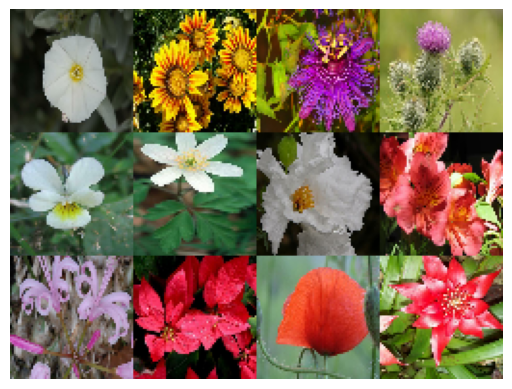

In [16]:
import imageio

SAMPLE_ROW = 3
SAMPLE_COL = 4
SAMPLE_NUM = SAMPLE_ROW * SAMPLE_COL

def generate_img(imgs, row, col, path=None):
    h, w, c = imgs[0].shape
    out = np.zeros((h * row, w * col, c), dtype=np.uint8)
    for n, img in enumerate(imgs):
        j, i = divmod(n, col)
        out[j * h : (j + 1) * h, i * w : (i + 1) * w, :] = img
    if path is not None: 
        imageio.imwrite(path, out)
    return out

num_steps = len(dataset)
print(f'Num steps: {num_steps}')

imgs, caps = next(iter(dataset))

# Show caption
# caps = caps[:SAMPLE_NUM].numpy()
# for idx, cap in enumerate(caps):
#     i, j = divmod(idx, SAMPLE_COL)
#     print(f'({i+1},{j+1}): {cap}')
    
# Show image
imgs = tf.clip_by_value((imgs[:SAMPLE_NUM] + 1) / 2 * 255, 0, 255)
img = generate_img(imgs, SAMPLE_ROW, SAMPLE_COL)
plt.imshow(img)
plt.axis("off")
plt.show()

# LOSS


In [17]:
optimizer_g = keras.optimizers.Adam(learning_rate=LEARNING_RATE, beta_1=0.5)
optimizer_d = keras.optimizers.Adam(learning_rate=LEARNING_RATE, beta_1=0.5)


In [18]:
EPOCHS_PER_CKPT = 5

checkpoint_path = '/media/dala/SD480G/comp3/ckpt-bert3'

ckpt = tf.train.Checkpoint(generator=generator,
                           discriminator=discriminator,
                           optimizer_g=optimizer_g,
                           optimizer_d=optimizer_d)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=3)

start_epoch = 1
if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    latest_ckpt = int(ckpt_manager.latest_checkpoint.split('-')[-1])
    start_epoch = EPOCHS_PER_CKPT * latest_ckpt + 1
    print(f'Restore from latest checkpoint: {ckpt_manager.latest_checkpoint.split("/")[-1]}')
    
print(f'Start epoch: {start_epoch}')


Restore from latest checkpoint: ckpt-240
Start epoch: 1201


In [19]:
LAMBDA = 10

@tf.function
def train_step_g(real_img, caption):
    input_g = tf.random.normal([BATCH_SIZE, Z_DIM])
    text = caption

    with tf.GradientTape() as tape_g:
        fake_img = generator(text, input_g, training=True)
        fake_pred = discriminator(text, fake_img, training=True)
        loss_g = -tf.reduce_mean(fake_pred)
        
    gradient_g = tape_g.gradient(loss_g, generator.trainable_variables)
    optimizer_g.apply_gradients(zip(gradient_g, generator.trainable_variables))
    
    return loss_g
    
@tf.function
def train_step_d(real_img, caption):
    input_g = tf.random.normal([BATCH_SIZE, Z_DIM])
    text = caption
    epsilon = tf.random.uniform(shape=[BATCH_SIZE, 1, 1, 1], minval=0, maxval=1)
    
    with tf.GradientTape() as tape_d:
        with tf.GradientTape() as tape_gp:
            fake_img = generator(text, input_g, training=True)
            fake_img_gp = epsilon * real_img + (1 - epsilon) * fake_img
            fake_pred_gp = discriminator(text, fake_img_gp, training=True)
        
        gradient_gp = tape_gp.gradient(fake_pred_gp, fake_img_gp)
        gradient_norm_gp = tf.sqrt(tf.reduce_sum(tf.square(gradient_gp), axis=np.arange(1, len(gradient_gp.shape))))
        gradient_penalty = tf.reduce_mean(tf.square(gradient_norm_gp - 1))
        
        fake_pred = discriminator(text, fake_img, training=True)
        real_pred = discriminator(text, real_img, training=True)
        
        loss_d = tf.reduce_mean(fake_pred) - tf.reduce_mean(real_pred) + LAMBDA * gradient_penalty
    
    gradient_d = tape_d.gradient(loss_d, discriminator.trainable_variables)
    optimizer_d.apply_gradients(zip(gradient_d, discriminator.trainable_variables))
    
    return loss_d


In [20]:
@tf.function
def test_step(caption):
    input_g = tf.random.normal([BATCH_SIZE, Z_DIM])
    text = caption
    fake_img = generator(text, input_g, training=False)
    return fake_img


# VISUAL

# 

In [21]:
visual_cap = [
    'flower with white long white petals and very long purple stamen ',
    'this medium white flower has rows of thin blue petals and thick stamen ',
    'this flower is white and purple in color with petals that are oval shaped ',
    'this flower is pink and yellow in color with petals that are oval shaped ',
    'the flower has a large bright orange petal with pink anther ',
    'the flower shown has a smooth white petal with patches of yellow as well ',
    'white petals that become yellow as they go to the center where there is an orange stamen ',
    'this flower has bright red petals with green pedicel as its main features ',
    'this flower has the overlapping yellow petals arranged closely toward the center ',
    'this flower has green sepals surrounding several layers of slightly ruffled pink petals ',
    'the pedicel on this flower is purple with a green sepal and rose colored petals ',
    'this white flower has connected circular petals with yellow stamen ',
    'the flower has yellow petals overlapping each other and are yellow in color ',
    'this flower has numerous stamen ringed by multiple layers of thin pink petals ',
    'the petals are broad but thin at the edges with purple tints at the edges and white in the middle ',
    'the yellow flower has petals that are soft smooth and arranged in two layers below the bunch of stamen ',
    'this flower has petals that are pink and yellow with yellow stamen ',
    'red stacked petals surround yellow stamen and a black pistil ',
    'the petals of the flower are in multiple layers and are pink in yellow in color ',
    'this flower has a yellow center and layers of peach colored petals with pointed tips ',
    'this bright pink flower has several fluttery petals and a tubular center ',
    'this flower is white and yellow in color with petals that are rounded at the endges ',
    'the flower has a several pieces of yellow colored petals that looks similar to its leaves ',
    'this flower has several light pink petals and yellow anthers ',
    'this flower is yellow and white in color with petals that are star shaped near the cener ',
    'lavender and white pedal and yellow small flower in the middle of the pedals ',
    'this flower has lavender petals with maroon stripes and brown anther filaments ',
    'this flower has six plain pale yellow petals that alternate with three dark yellow speckled petals ',
    'this flower has petals that are yellow with orange lines ',
    'the flower has petals that are orange with yellow stamen ',
    'this flower has a brown center surrounded by layers of long yellow petals with rounded tips ',
    'this flower is lavender in color with petals that are ruffled and wavy ',
    'this flower is blue in color with petals that have veins ',
    'the petals on this flower are white with yellow stamen ',
    'this flower has petals that are cone shaped and dark purple ',
    'this flower is purple and white in color and has petals that are multi colored ',
    'a large group of bells that are blue on this flower ',
    'this flower is bright purple with many pedals that are roundish whth pale white outer petals ',
    'this flower has large yellow petals and long yellow stamen on it ',
    'this flower has spiky blue petals and a spiky black stigma on it ',
    'this flower is purple and yellow in color with petals that are oval shaped ',
    'the flower has petals that are large and pink with yellow anther',
]


# Testing Dataset

In [22]:
def testing_data_generator(caption, index):
    caption = tf.cast(caption, tf.float32)
    return index, caption

def testing_dataset_generator(batch_size, data_generator):
    data = pd.read_pickle('/media/dala/SD480G/comp3/dataset/dataset/testData.pkl')
    captions = data['Captions'].values
    caption = np.asarray(captions)
#     caption = caption.astype(np.int32)
    caption = [sent2WordList(x) for x in caption]
    caption = tf.concat(
        [text_encoder(caption[64 * i:64 * min(len(caption), i + 1)]) \
             for i in range((len(caption) + 63) // 64)], 
        axis=0)
    caption = caption.numpy()
    caption = np.asarray(caption)
    index = data['ID'].values
    index = np.asarray(index)
    
    assert caption.shape[0] == index.shape[0]
    
    dataset = tf.data.Dataset.from_tensor_slices((caption, index))
    dataset = dataset.map(data_generator, num_parallel_calls=tf.data.experimental.AUTOTUNE)
    dataset = dataset.repeat().batch(batch_size, drop_remainder=True)
    
    return dataset


In [23]:

testing_dataset  = testing_dataset_generator(BATCH_SIZE, testing_data_generator)


In [24]:
data = pd.read_pickle('/media/dala/SD480G/comp3/dataset/dataset/testData.pkl')
captions = data['Captions'].values

NUM_TEST = len(captions)
EPOCH_TEST = int(NUM_TEST / BATCH_SIZE)


# Inference

In [25]:
if not os.path.exists('./inference/demo'):
    os.makedirs('./inference/demo')


In [26]:
def inference(dataset):
    step = 0
    start = time.time()
    for idx, captions in dataset:
        if step > EPOCH_TEST:
            break
        
        fake_image = test_step(captions)
        step += 1
        #print (os.getcwd)
        for i in range(BATCH_SIZE):
            img = np.clip(fake_image[i].numpy() * 0.5 + 0.5, 0.0, 1.0)
            plt.imsave('/home/dala/guest/DL_comp3/inference/demo/inference_{:04d}.jpg'.format(idx[i]), img)
            
    print('Time for inference is {:.4f} sec'.format(time.time() - start))

In [27]:
inference(testing_dataset)

Time for inference is 3.4196 sec


# Training with inferencing

In [28]:
import subprocess

def run_command_with_epoch(epoch):
    """Run the command in the 'testing' directory and save results with an epoch postfix."""
    command_base = ["python", "inception_score.py", "../inference/demo"]
    output_file = f"../score_demo_epoch_{epoch:04d}.csv"
    command = command_base + [output_file, "39"]

    try:
        # Execute the command
        subprocess.run(command, check=True)
        print(f"Command executed successfully, output saved to {output_file}.")
    except subprocess.CalledProcessError as e:
        print(f"Command failed with error: {e}")
    except Exception as e:
        print(f"Unexpected error: {e}")

    return output_file

def eval_score(file_path):
    # Read the CSV file
    data = pd.read_csv(file_path)

    # Calculate the average of the 'score' column
    average_score = data['score'].mean()

    # Print the average score
    print(f'Average score: {average_score}')

In [29]:
inference(testing_dataset)

Time for inference is 0.6418 sec


100%|██████████| 6609/6609 [04:45<00:00, 23.14it/s]  


Epoch 1046: Loss_g 9.47007, Loss_d -6.78758


100%|██████████| 6609/6609 [04:43<00:00, 23.31it/s]  


Epoch 1047: Loss_g 4.86195, Loss_d -5.50512


100%|██████████| 6609/6609 [04:43<00:00, 23.31it/s]  


Epoch 1048: Loss_g 3.92276, Loss_d -6.10835


100%|██████████| 6609/6609 [04:43<00:00, 23.32it/s]  


Epoch 1049: Loss_g -1.83937, Loss_d -6.42884


100%|██████████| 6609/6609 [04:43<00:00, 23.32it/s]  


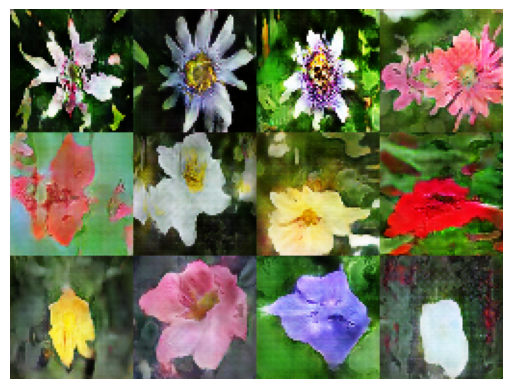

Epoch 1050: Loss_g 10.09754, Loss_d -6.36666


100%|██████████| 6609/6609 [04:43<00:00, 23.30it/s]  


Epoch 1051: Loss_g 1.98526, Loss_d -7.01007


100%|██████████| 6609/6609 [04:43<00:00, 23.30it/s]  


Epoch 1052: Loss_g 2.36354, Loss_d -8.94320


100%|██████████| 6609/6609 [04:43<00:00, 23.30it/s]  


Epoch 1053: Loss_g 3.22437, Loss_d -6.75870


100%|██████████| 6609/6609 [04:43<00:00, 23.29it/s]  


Epoch 1054: Loss_g -0.41916, Loss_d -7.15888


100%|██████████| 6609/6609 [04:43<00:00, 23.29it/s]  


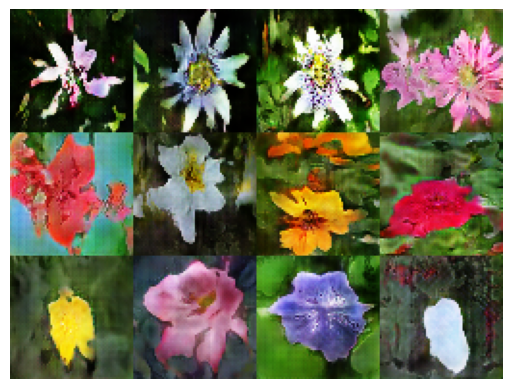

Epoch 1055: Loss_g 7.48709, Loss_d -8.25040


100%|██████████| 6609/6609 [04:43<00:00, 23.29it/s]  


Epoch 1056: Loss_g 4.37041, Loss_d -6.00866


100%|██████████| 6609/6609 [04:43<00:00, 23.31it/s]  


Epoch 1057: Loss_g -3.15660, Loss_d -6.91405


100%|██████████| 6609/6609 [04:43<00:00, 23.31it/s]  


Epoch 1058: Loss_g 3.89067, Loss_d -6.13146


100%|██████████| 6609/6609 [04:43<00:00, 23.29it/s]  


Epoch 1059: Loss_g 4.58979, Loss_d -6.36872


100%|██████████| 6609/6609 [04:43<00:00, 23.29it/s]  


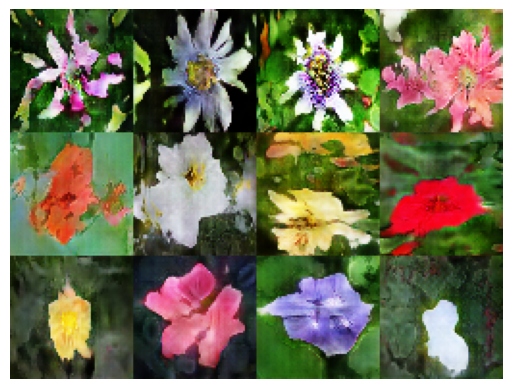

Epoch 1060: Loss_g 1.95805, Loss_d -6.58865


100%|██████████| 6609/6609 [04:43<00:00, 23.28it/s]  


Epoch 1061: Loss_g 4.77560, Loss_d -6.51145


100%|██████████| 6609/6609 [04:43<00:00, 23.28it/s]  


Epoch 1062: Loss_g 8.19519, Loss_d -6.92524


100%|██████████| 6609/6609 [04:43<00:00, 23.28it/s]  


Epoch 1063: Loss_g 2.62952, Loss_d -6.80828


100%|██████████| 6609/6609 [04:43<00:00, 23.29it/s]  


Epoch 1064: Loss_g 0.79033, Loss_d -7.05351


100%|██████████| 6609/6609 [04:43<00:00, 23.29it/s]  


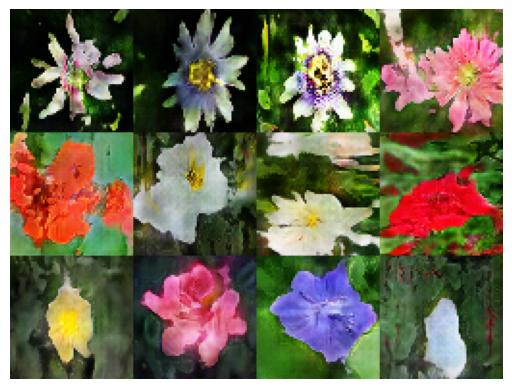

Epoch 1065: Loss_g -1.02797, Loss_d -6.49619


100%|██████████| 6609/6609 [04:43<00:00, 23.28it/s]  


Epoch 1066: Loss_g 17.16348, Loss_d -6.87760


100%|██████████| 6609/6609 [04:43<00:00, 23.27it/s]  


Epoch 1067: Loss_g 1.23688, Loss_d -6.74933


100%|██████████| 6609/6609 [04:43<00:00, 23.27it/s]  


Epoch 1068: Loss_g 2.46286, Loss_d -6.60417


100%|██████████| 6609/6609 [04:44<00:00, 23.27it/s]  


Epoch 1069: Loss_g 6.24388, Loss_d -7.31823


100%|██████████| 6609/6609 [04:43<00:00, 23.28it/s]  


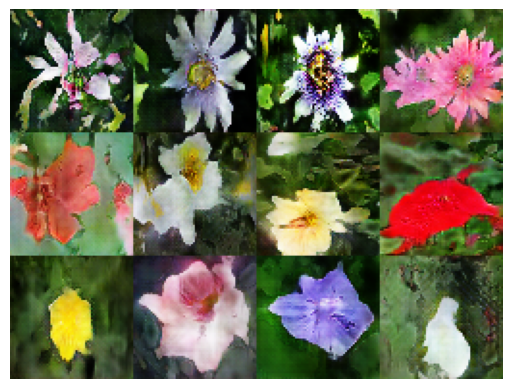

Epoch 1070: Loss_g 12.85215, Loss_d -7.57204


100%|██████████| 6609/6609 [04:44<00:00, 23.25it/s]  


Epoch 1071: Loss_g -1.77744, Loss_d -6.91041


100%|██████████| 6609/6609 [04:43<00:00, 23.27it/s]  


Epoch 1072: Loss_g 5.41273, Loss_d -7.31163


100%|██████████| 6609/6609 [04:44<00:00, 23.26it/s]  


Epoch 1073: Loss_g 10.28535, Loss_d -7.98408


100%|██████████| 6609/6609 [04:44<00:00, 23.26it/s]  


Epoch 1074: Loss_g 3.79725, Loss_d -5.68308


100%|██████████| 6609/6609 [04:43<00:00, 23.27it/s]  


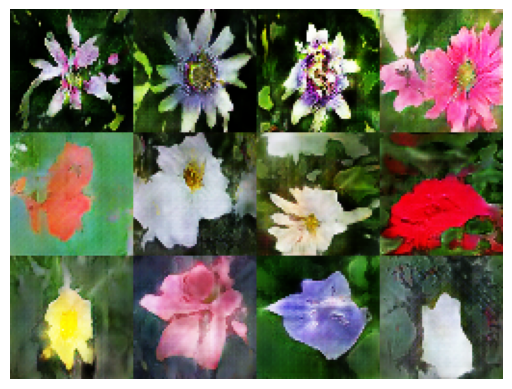

Epoch 1075: Loss_g 9.21878, Loss_d -8.30474


100%|██████████| 6609/6609 [04:44<00:00, 23.26it/s]  


Epoch 1076: Loss_g 5.03578, Loss_d -6.04524


100%|██████████| 6609/6609 [04:44<00:00, 23.27it/s]  


Epoch 1077: Loss_g 5.71989, Loss_d -7.30796


100%|██████████| 6609/6609 [04:44<00:00, 23.26it/s]  


Epoch 1078: Loss_g 2.88150, Loss_d -7.41297


100%|██████████| 6609/6609 [04:44<00:00, 23.25it/s]  


Epoch 1079: Loss_g 0.14703, Loss_d -7.62645


100%|██████████| 6609/6609 [04:44<00:00, 23.26it/s]  


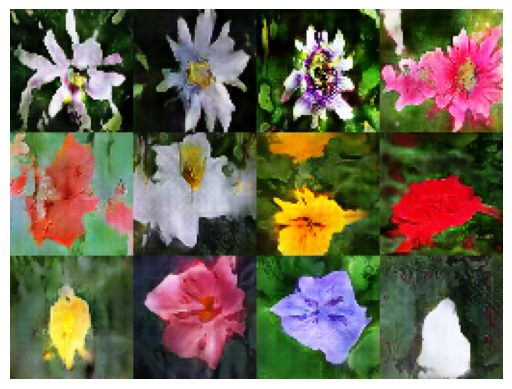

Epoch 1080: Loss_g 6.13835, Loss_d -7.82313


100%|██████████| 6609/6609 [04:43<00:00, 23.28it/s]  


Epoch 1081: Loss_g 12.02110, Loss_d -7.54131


100%|██████████| 6609/6609 [04:43<00:00, 23.28it/s]  


Epoch 1082: Loss_g 4.27715, Loss_d -6.58279


100%|██████████| 6609/6609 [04:44<00:00, 23.26it/s]  


Epoch 1083: Loss_g 0.02615, Loss_d -8.02952


100%|██████████| 6609/6609 [04:44<00:00, 23.26it/s]  


Epoch 1084: Loss_g 14.44379, Loss_d -7.09674


100%|██████████| 6609/6609 [04:44<00:00, 23.26it/s]  


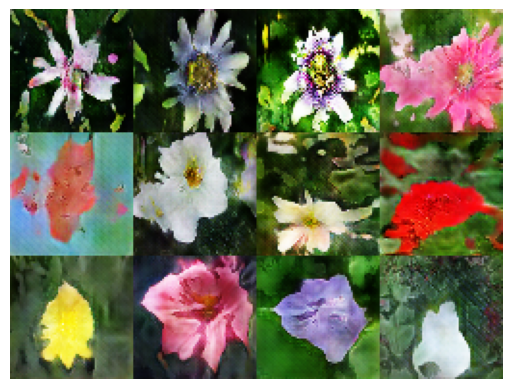

Epoch 1085: Loss_g 4.79712, Loss_d -7.51767


100%|██████████| 6609/6609 [04:44<00:00, 23.27it/s]  


Epoch 1086: Loss_g -3.78621, Loss_d -6.79389


100%|██████████| 6609/6609 [04:44<00:00, 23.26it/s]  


Epoch 1087: Loss_g 3.63009, Loss_d -7.28589


100%|██████████| 6609/6609 [04:44<00:00, 23.24it/s]  


Epoch 1088: Loss_g 5.81667, Loss_d -6.12470


100%|██████████| 6609/6609 [04:44<00:00, 23.25it/s]  


Epoch 1089: Loss_g 7.83042, Loss_d -5.69219


100%|██████████| 6609/6609 [04:44<00:00, 23.27it/s]  


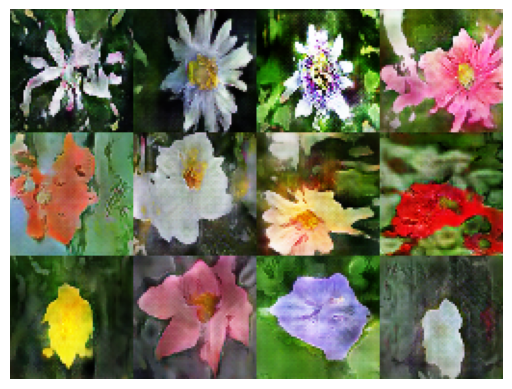

Epoch 1090: Loss_g -0.40163, Loss_d -7.07158


100%|██████████| 6609/6609 [04:44<00:00, 23.25it/s]  


Epoch 1091: Loss_g 5.24209, Loss_d -7.49035


100%|██████████| 6609/6609 [04:44<00:00, 23.26it/s]  


Epoch 1092: Loss_g 8.18365, Loss_d -7.49351


100%|██████████| 6609/6609 [04:44<00:00, 23.27it/s]  


Epoch 1093: Loss_g 2.86154, Loss_d -6.85387


100%|██████████| 6609/6609 [04:43<00:00, 23.27it/s]  


Epoch 1094: Loss_g 2.86064, Loss_d -6.77430


100%|██████████| 6609/6609 [04:44<00:00, 23.26it/s]  


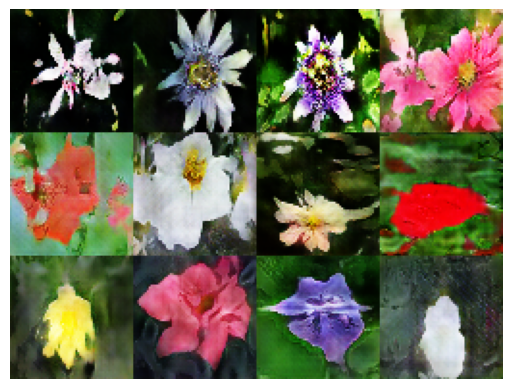

Epoch 1095: Loss_g -1.26980, Loss_d -8.06637


100%|██████████| 6609/6609 [04:44<00:00, 23.26it/s]  


Epoch 1096: Loss_g 7.27675, Loss_d -6.39190


100%|██████████| 6609/6609 [04:44<00:00, 23.25it/s]  


Epoch 1097: Loss_g 3.02770, Loss_d -7.32794


100%|██████████| 6609/6609 [04:44<00:00, 23.26it/s]  


Epoch 1098: Loss_g 9.67488, Loss_d -6.16748


100%|██████████| 6609/6609 [04:44<00:00, 23.26it/s]  


Epoch 1099: Loss_g 4.26683, Loss_d -6.76839


100%|██████████| 6609/6609 [04:44<00:00, 23.25it/s]  


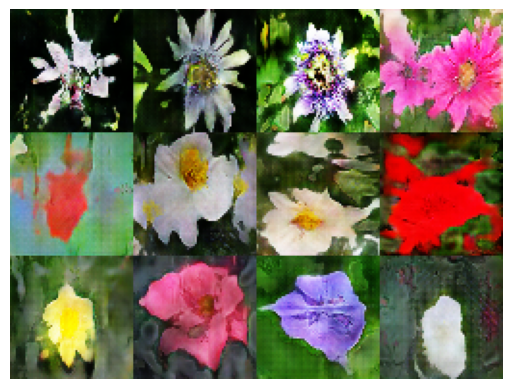

Epoch 1100: Loss_g 1.92145, Loss_d -7.43469


100%|██████████| 6609/6609 [04:44<00:00, 23.25it/s]  


Epoch 1101: Loss_g 6.98139, Loss_d -6.78028


100%|██████████| 6609/6609 [04:44<00:00, 23.24it/s]  


Epoch 1102: Loss_g 1.91605, Loss_d -7.50592


100%|██████████| 6609/6609 [04:44<00:00, 23.26it/s]  


Epoch 1103: Loss_g 11.26222, Loss_d -6.55178


100%|██████████| 6609/6609 [04:44<00:00, 23.25it/s]  


Epoch 1104: Loss_g 3.90757, Loss_d -6.76327


100%|██████████| 6609/6609 [04:44<00:00, 23.26it/s]  


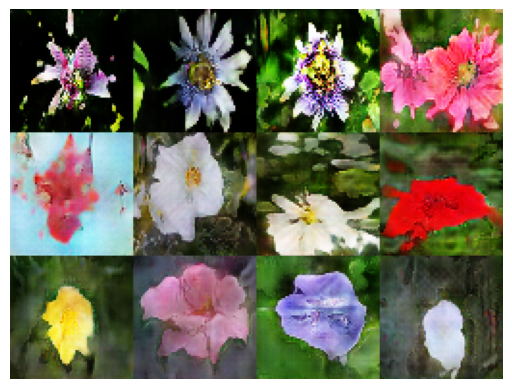

Epoch 1105: Loss_g 5.30732, Loss_d -7.87189


100%|██████████| 6609/6609 [04:44<00:00, 23.24it/s]  


Epoch 1106: Loss_g 9.19920, Loss_d -6.80377


100%|██████████| 6609/6609 [04:44<00:00, 23.26it/s]  


Epoch 1107: Loss_g 4.38303, Loss_d -6.69697


100%|██████████| 6609/6609 [04:44<00:00, 23.26it/s]  


Epoch 1108: Loss_g 5.23629, Loss_d -6.39044


100%|██████████| 6609/6609 [04:44<00:00, 23.26it/s]  


Epoch 1109: Loss_g 3.20689, Loss_d -9.47281


100%|██████████| 6609/6609 [04:44<00:00, 23.27it/s]  


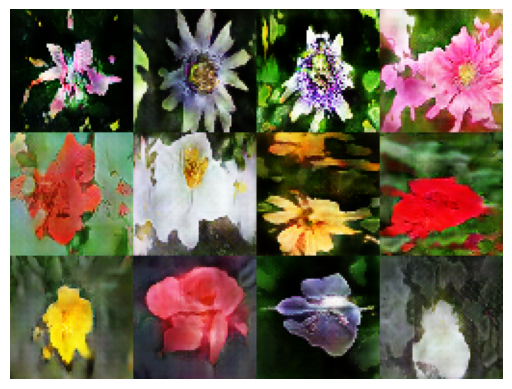

Epoch 1110: Loss_g 5.47173, Loss_d -6.18023


100%|██████████| 6609/6609 [04:44<00:00, 23.25it/s]  


Epoch 1111: Loss_g 4.48886, Loss_d -7.19128


100%|██████████| 6609/6609 [04:44<00:00, 23.25it/s]  


Epoch 1112: Loss_g 6.81781, Loss_d -6.66543


100%|██████████| 6609/6609 [04:44<00:00, 23.24it/s]  


Epoch 1113: Loss_g 10.22464, Loss_d -6.67162


100%|██████████| 6609/6609 [04:44<00:00, 23.24it/s]  


Epoch 1114: Loss_g 1.53588, Loss_d -5.52036


100%|██████████| 6609/6609 [04:44<00:00, 23.24it/s]  


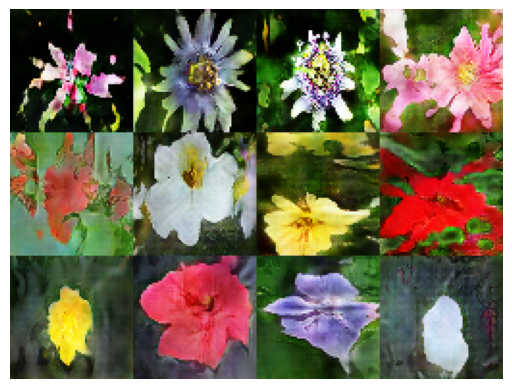

Epoch 1115: Loss_g 8.42229, Loss_d -6.56994


100%|██████████| 6609/6609 [04:44<00:00, 23.25it/s]  


Epoch 1116: Loss_g 0.98499, Loss_d -7.15655


100%|██████████| 6609/6609 [04:44<00:00, 23.23it/s]  


Epoch 1117: Loss_g 15.12647, Loss_d -6.88166


100%|██████████| 6609/6609 [04:44<00:00, 23.24it/s]  


Epoch 1118: Loss_g 1.90204, Loss_d -6.79351


100%|██████████| 6609/6609 [04:44<00:00, 23.24it/s]  


Epoch 1119: Loss_g 1.69706, Loss_d -5.34025


100%|██████████| 6609/6609 [04:44<00:00, 23.24it/s]  


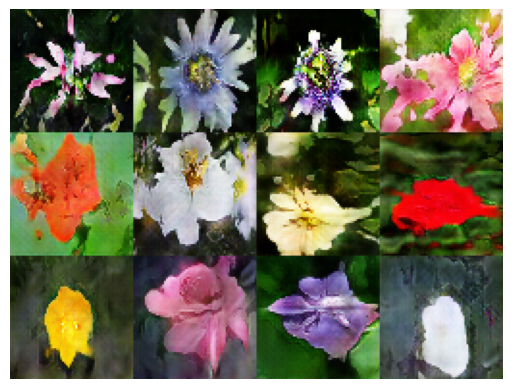

Epoch 1120: Loss_g 2.53691, Loss_d -6.57978


100%|██████████| 6609/6609 [04:44<00:00, 23.24it/s]  


Epoch 1121: Loss_g 6.83382, Loss_d -5.92438


100%|██████████| 6609/6609 [04:44<00:00, 23.25it/s]  


Epoch 1122: Loss_g 1.24739, Loss_d -5.32882


100%|██████████| 6609/6609 [04:44<00:00, 23.25it/s]  


Epoch 1123: Loss_g 4.02957, Loss_d -6.15793


100%|██████████| 6609/6609 [04:44<00:00, 23.24it/s]  


Epoch 1124: Loss_g 5.05293, Loss_d -6.65990


100%|██████████| 6609/6609 [04:44<00:00, 23.23it/s]  


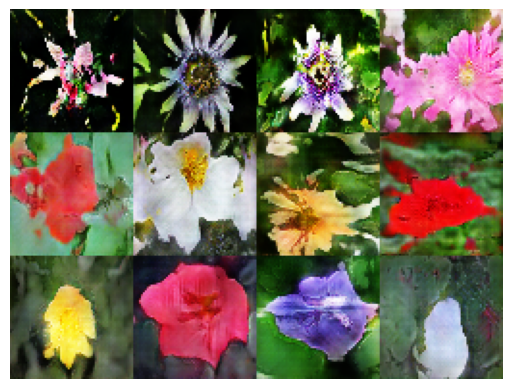

Epoch 1125: Loss_g 5.83695, Loss_d -6.00818


100%|██████████| 6609/6609 [04:44<00:00, 23.24it/s]  


Epoch 1126: Loss_g 5.02880, Loss_d -7.37603


100%|██████████| 6609/6609 [04:44<00:00, 23.24it/s]  


Epoch 1127: Loss_g 6.72218, Loss_d -7.01993


100%|██████████| 6609/6609 [04:44<00:00, 23.23it/s]  


Epoch 1128: Loss_g 0.33605, Loss_d -7.12071


100%|██████████| 6609/6609 [04:44<00:00, 23.25it/s]  


Epoch 1129: Loss_g 12.02164, Loss_d -6.46842


100%|██████████| 6609/6609 [04:44<00:00, 23.23it/s]  


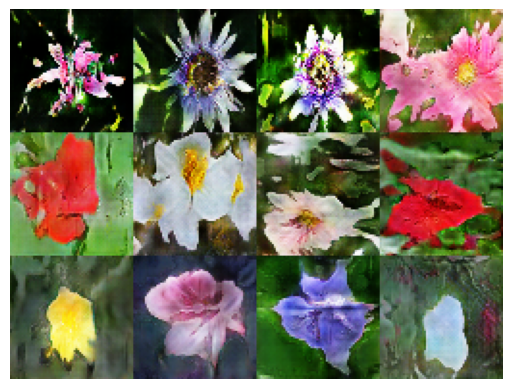

Epoch 1130: Loss_g 9.15777, Loss_d -8.45994


100%|██████████| 6609/6609 [04:44<00:00, 23.23it/s]  


Epoch 1131: Loss_g 3.20162, Loss_d -8.00443


100%|██████████| 6609/6609 [04:44<00:00, 23.22it/s]  


Epoch 1132: Loss_g 4.70460, Loss_d -5.66890


100%|██████████| 6609/6609 [04:44<00:00, 23.23it/s]  


Epoch 1133: Loss_g 4.55796, Loss_d -6.69946


100%|██████████| 6609/6609 [04:44<00:00, 23.22it/s]  


Epoch 1134: Loss_g 6.38307, Loss_d -7.97804


100%|██████████| 6609/6609 [04:44<00:00, 23.23it/s]  


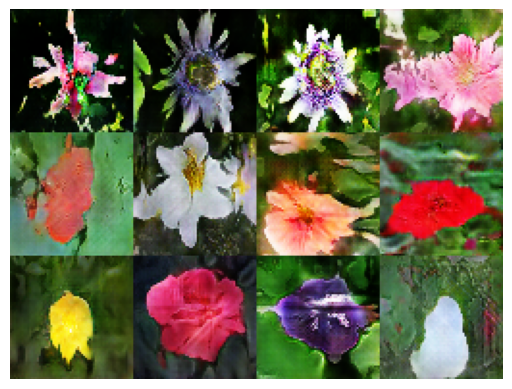

Epoch 1135: Loss_g 10.92803, Loss_d -6.05891


100%|██████████| 6609/6609 [04:44<00:00, 23.23it/s]  


Epoch 1136: Loss_g 6.32627, Loss_d -6.66837


100%|██████████| 6609/6609 [04:44<00:00, 23.23it/s]  


Epoch 1137: Loss_g 9.15670, Loss_d -7.06842


100%|██████████| 6609/6609 [04:44<00:00, 23.22it/s]  


Epoch 1138: Loss_g 8.53757, Loss_d -7.34661


100%|██████████| 6609/6609 [04:44<00:00, 23.24it/s]  


Epoch 1139: Loss_g 8.95300, Loss_d -8.69243


100%|██████████| 6609/6609 [04:44<00:00, 23.21it/s]  


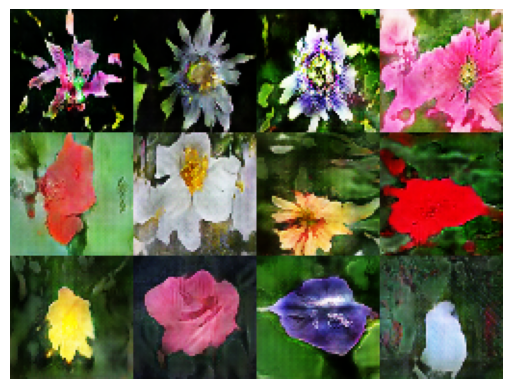

Epoch 1140: Loss_g 7.37004, Loss_d -6.46853


100%|██████████| 6609/6609 [04:44<00:00, 23.22it/s]  


Epoch 1141: Loss_g 2.49828, Loss_d -6.92647


100%|██████████| 6609/6609 [04:44<00:00, 23.21it/s]  


Epoch 1142: Loss_g 2.08519, Loss_d -6.49097


100%|██████████| 6609/6609 [04:44<00:00, 23.23it/s]  


Epoch 1143: Loss_g 1.68206, Loss_d -8.71422


100%|██████████| 6609/6609 [04:44<00:00, 23.22it/s]  


Epoch 1144: Loss_g 15.39456, Loss_d -7.33859


100%|██████████| 6609/6609 [04:44<00:00, 23.22it/s]  


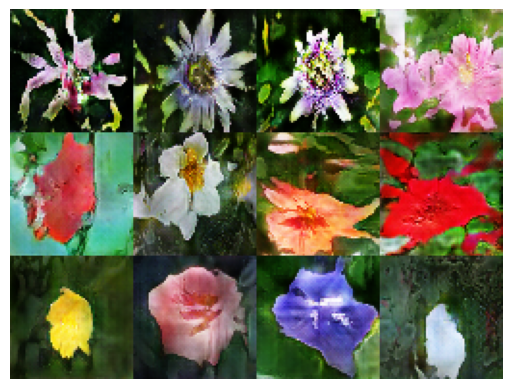

Epoch 1145: Loss_g 1.95894, Loss_d -7.25994


100%|██████████| 6609/6609 [04:44<00:00, 23.23it/s]  


Epoch 1146: Loss_g 8.09831, Loss_d -7.58263


100%|██████████| 6609/6609 [04:44<00:00, 23.22it/s]  


Epoch 1147: Loss_g 6.12178, Loss_d -6.92745


100%|██████████| 6609/6609 [04:44<00:00, 23.22it/s]  


Epoch 1148: Loss_g 8.82323, Loss_d -6.22924


100%|██████████| 6609/6609 [04:44<00:00, 23.21it/s]  


Epoch 1149: Loss_g 8.89849, Loss_d -7.64737


100%|██████████| 6609/6609 [04:44<00:00, 23.22it/s]  


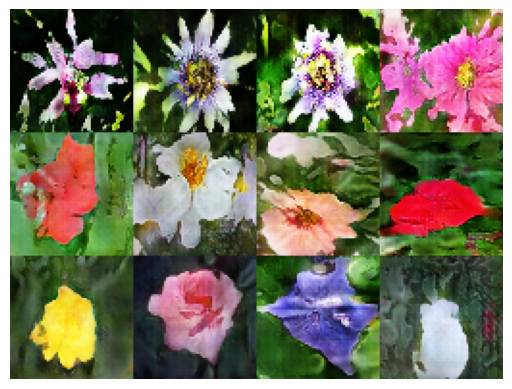

Epoch 1150: Loss_g 16.31305, Loss_d -6.38989


100%|██████████| 6609/6609 [04:44<00:00, 23.22it/s]  


Epoch 1151: Loss_g 7.07469, Loss_d -7.09008


100%|██████████| 6609/6609 [04:44<00:00, 23.23it/s]  


Epoch 1152: Loss_g 13.00198, Loss_d -5.89435


100%|██████████| 6609/6609 [04:44<00:00, 23.21it/s]  


Epoch 1153: Loss_g 1.83450, Loss_d -6.67671


100%|██████████| 6609/6609 [04:44<00:00, 23.22it/s]  


Epoch 1154: Loss_g 6.55433, Loss_d -6.27760


100%|██████████| 6609/6609 [04:44<00:00, 23.22it/s]  


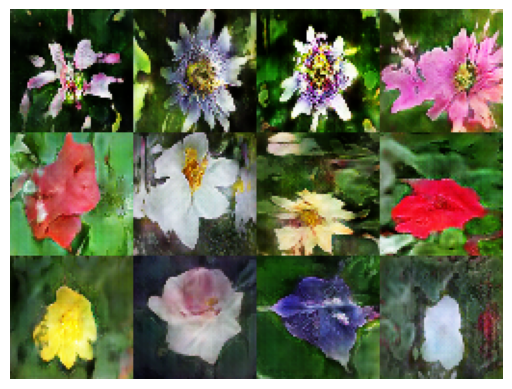

Epoch 1155: Loss_g -0.00650, Loss_d -7.25894


100%|██████████| 6609/6609 [04:44<00:00, 23.21it/s]  


Epoch 1156: Loss_g 4.41273, Loss_d -6.88512


100%|██████████| 6609/6609 [04:44<00:00, 23.21it/s]  


Epoch 1157: Loss_g 10.41439, Loss_d -7.39887


100%|██████████| 6609/6609 [04:44<00:00, 23.22it/s]  


Epoch 1158: Loss_g 7.48712, Loss_d -6.01882


100%|██████████| 6609/6609 [04:44<00:00, 23.22it/s]  


Epoch 1159: Loss_g 4.28670, Loss_d -6.35735


100%|██████████| 6609/6609 [04:44<00:00, 23.21it/s]  


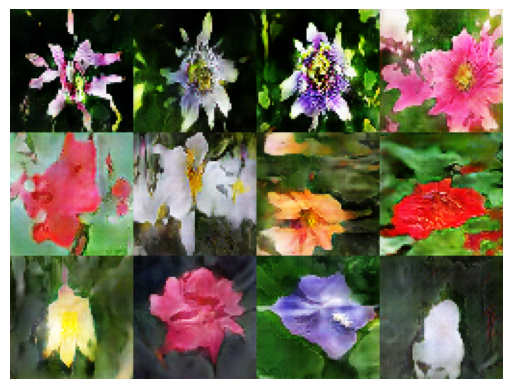

Epoch 1160: Loss_g -5.41766, Loss_d -6.58250


100%|██████████| 6609/6609 [04:44<00:00, 23.21it/s]  


Epoch 1161: Loss_g 2.13477, Loss_d -6.87616


100%|██████████| 6609/6609 [04:44<00:00, 23.22it/s]  


Epoch 1162: Loss_g 10.02644, Loss_d -8.49175


100%|██████████| 6609/6609 [04:44<00:00, 23.21it/s]  


Epoch 1163: Loss_g 5.07991, Loss_d -7.02549


100%|██████████| 6609/6609 [04:44<00:00, 23.21it/s]  


Epoch 1164: Loss_g 7.80726, Loss_d -6.93874


100%|██████████| 6609/6609 [04:44<00:00, 23.20it/s]  


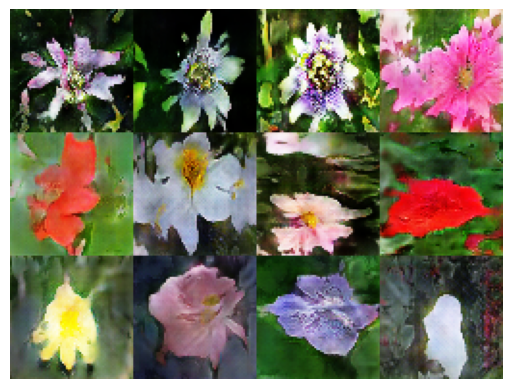

Epoch 1165: Loss_g 2.55235, Loss_d -6.98379


100%|██████████| 6609/6609 [04:44<00:00, 23.21it/s]  


Epoch 1166: Loss_g 10.57781, Loss_d -7.12358


100%|██████████| 6609/6609 [04:44<00:00, 23.21it/s]  


Epoch 1167: Loss_g 3.29685, Loss_d -6.86185


100%|██████████| 6609/6609 [04:44<00:00, 23.21it/s]  


Epoch 1168: Loss_g 4.59646, Loss_d -7.75603


100%|██████████| 6609/6609 [04:44<00:00, 23.20it/s]  


Epoch 1169: Loss_g 1.90119, Loss_d -7.35949


100%|██████████| 6609/6609 [04:44<00:00, 23.19it/s]  


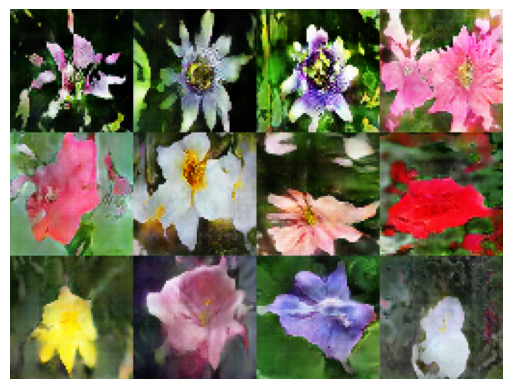

Epoch 1170: Loss_g 8.37107, Loss_d -7.37146


100%|██████████| 6609/6609 [04:44<00:00, 23.21it/s]  


Epoch 1171: Loss_g 3.82102, Loss_d -6.75255


100%|██████████| 6609/6609 [04:44<00:00, 23.19it/s]  


Epoch 1172: Loss_g 13.84273, Loss_d -6.07742


100%|██████████| 6609/6609 [04:44<00:00, 23.21it/s]  


Epoch 1173: Loss_g -1.09611, Loss_d -6.63438


100%|██████████| 6609/6609 [04:44<00:00, 23.21it/s]  


Epoch 1174: Loss_g 10.49387, Loss_d -6.74651


100%|██████████| 6609/6609 [04:44<00:00, 23.20it/s]  


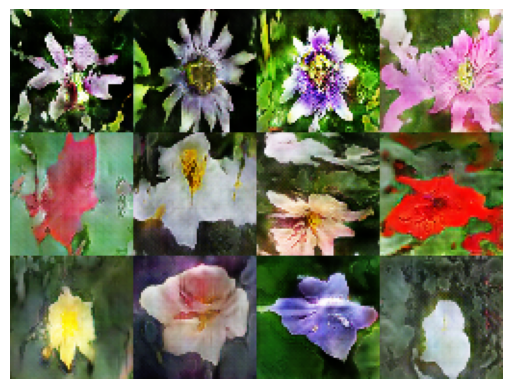

Epoch 1175: Loss_g 11.75122, Loss_d -7.51650


100%|██████████| 6609/6609 [04:44<00:00, 23.20it/s]  


Epoch 1176: Loss_g 6.54413, Loss_d -7.68928


100%|██████████| 6609/6609 [04:44<00:00, 23.20it/s]  


Epoch 1177: Loss_g 13.91042, Loss_d -7.60234


100%|██████████| 6609/6609 [04:44<00:00, 23.19it/s]  


Epoch 1178: Loss_g 3.40775, Loss_d -6.21881


100%|██████████| 6609/6609 [04:44<00:00, 23.19it/s]  


Epoch 1179: Loss_g 1.96332, Loss_d -6.36311


100%|██████████| 6609/6609 [04:44<00:00, 23.21it/s]  


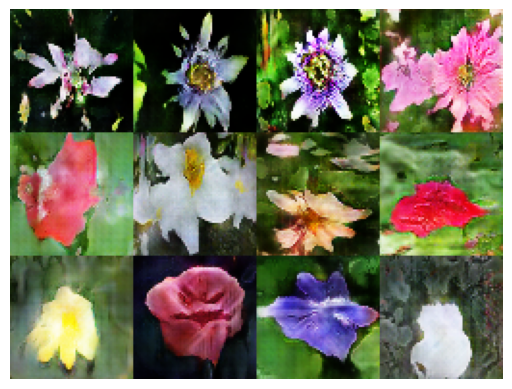

Epoch 1180: Loss_g 5.39854, Loss_d -6.74508


100%|██████████| 6609/6609 [04:44<00:00, 23.19it/s]  


Epoch 1181: Loss_g 12.96026, Loss_d -7.76321


100%|██████████| 6609/6609 [04:44<00:00, 23.20it/s]  


Epoch 1182: Loss_g 8.72962, Loss_d -6.13937


100%|██████████| 6609/6609 [04:44<00:00, 23.19it/s]  


Epoch 1183: Loss_g 4.61089, Loss_d -8.31157


100%|██████████| 6609/6609 [04:44<00:00, 23.21it/s]  


Epoch 1184: Loss_g 7.66711, Loss_d -6.71120


100%|██████████| 6609/6609 [04:45<00:00, 23.19it/s]  


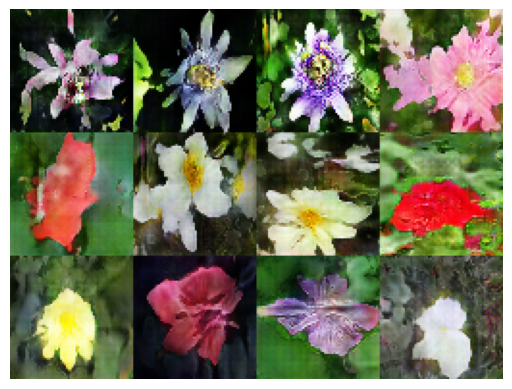

Epoch 1185: Loss_g 1.66751, Loss_d -6.98290


100%|██████████| 6609/6609 [04:44<00:00, 23.19it/s]  


Epoch 1186: Loss_g 18.75582, Loss_d -7.09881


100%|██████████| 6609/6609 [04:44<00:00, 23.20it/s]  


Epoch 1187: Loss_g 11.39223, Loss_d -7.76848


100%|██████████| 6609/6609 [04:44<00:00, 23.20it/s]  


Epoch 1188: Loss_g 9.47308, Loss_d -6.73725


100%|██████████| 6609/6609 [04:44<00:00, 23.19it/s]  


Epoch 1189: Loss_g 15.85908, Loss_d -6.62368


100%|██████████| 6609/6609 [04:44<00:00, 23.19it/s]  


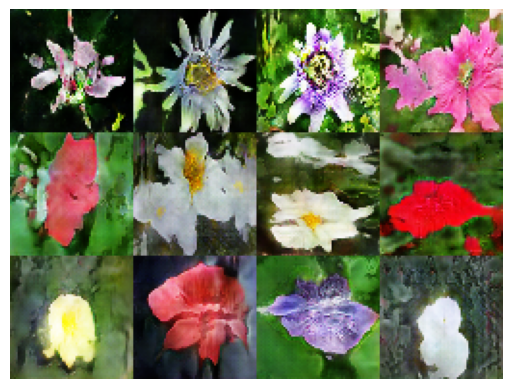

Epoch 1190: Loss_g 7.70752, Loss_d -6.96139


100%|██████████| 6609/6609 [04:44<00:00, 23.19it/s]  


Epoch 1191: Loss_g 9.67837, Loss_d -6.83570


100%|██████████| 6609/6609 [04:44<00:00, 23.20it/s]  


Epoch 1192: Loss_g 11.07937, Loss_d -5.59507


100%|██████████| 6609/6609 [04:44<00:00, 23.19it/s]  


Epoch 1193: Loss_g 14.82477, Loss_d -7.62952


100%|██████████| 6609/6609 [04:44<00:00, 23.20it/s]  


Epoch 1194: Loss_g 11.98540, Loss_d -8.10762


100%|██████████| 6609/6609 [04:44<00:00, 23.19it/s]  


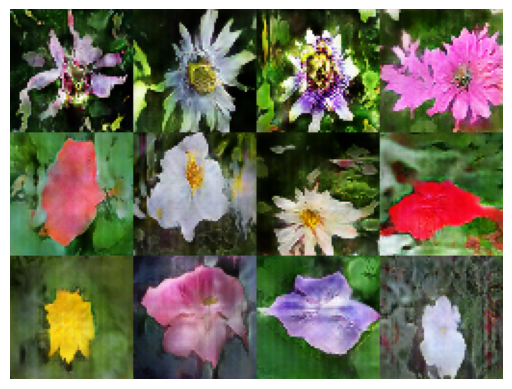

Epoch 1195: Loss_g 9.01193, Loss_d -7.30179


100%|██████████| 6609/6609 [04:44<00:00, 23.20it/s]  


Epoch 1196: Loss_g 8.31923, Loss_d -8.33899


100%|██████████| 6609/6609 [04:44<00:00, 23.19it/s]  


Epoch 1197: Loss_g 6.98473, Loss_d -7.14823


100%|██████████| 6609/6609 [04:44<00:00, 23.19it/s]  


Epoch 1198: Loss_g 10.88341, Loss_d -7.89185


100%|██████████| 6609/6609 [04:44<00:00, 23.20it/s]  


Epoch 1199: Loss_g 9.69819, Loss_d -6.96517


100%|██████████| 6609/6609 [04:44<00:00, 23.19it/s]  


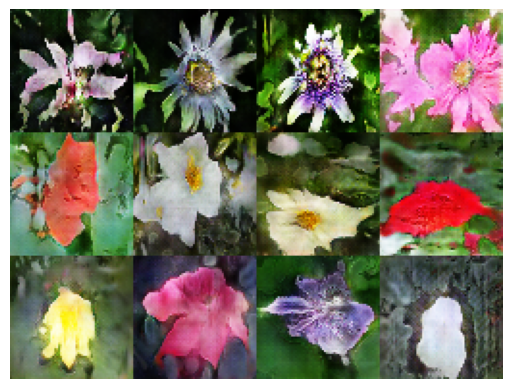

Time for inference is 0.6180 sec
Epoch 1200: Loss_g 8.94207, Loss_d -6.44574


 40%|███▉      | 2613/6609 [04:00<00:45, 88.79it/s]  

In [ ]:
if not os.path.exists('samples/demo'):
    os.makedirs('samples/demo')

EPOCHS = 2000
N_CRITIC = 3

loss_x_list = []
loss_g_list = []
loss_d_list = []

start = time.time()

sample_z = tf.random.normal([SAMPLE_NUM, Z_DIM])
sample_cap = visual_cap[:SAMPLE_NUM]

for epoch in range(start_epoch, EPOCHS + 1):
    
    loss_g = 0
    loss_d = 0
    
    # Train step
    for step, (img, cap) in tqdm(enumerate(dataset), total=num_steps):
        if step % (N_CRITIC + 1) == N_CRITIC - 1:
            loss_g += train_step_g(img, cap)
            # Store data to list
            loss_x_list.append(epoch + step / num_steps)
            loss_g_list.append(loss_g / 1)
            loss_d_list.append(loss_d / N_CRITIC)
            loss_g = 0
            loss_d = 0
        else:
            loss_d += train_step_d(img, cap)
    
    # Save checkpoint
    if epoch % EPOCHS_PER_CKPT == 0:
        ckpt_manager.save()
    
    # Generate sample image
    sample_text = text_encoder(sample_cap)
    sample_imgs = generator(sample_text, sample_z, training=False)
    sample_imgs = tf.clip_by_value((sample_imgs + 1) / 2 * 255, 0, 255)
    img = generate_img(sample_imgs, SAMPLE_ROW, SAMPLE_COL, f'/media/dala/SD480G/comp3/imgs/{epoch:>04d}.png')
    
    # Display sample image
    if epoch % 5 == 0:
        plt.imshow(img)
        plt.axis("off")
        plt.show()
        
        '''
        inference(testing_dataset)
        
        # Change to the testing directory
        testing_dir = "/home/dala/guest/DL_comp3/testing"
        original_dir = os.getcwd()  # Save the current directory
        os.chdir(testing_dir)
        # print(f"Changed directory to {testing_dir}. Running command: {' '.join(command)}")
        
        # Run command with the current epoch
        output_file = run_command_with_epoch(epoch)
        print(output_file)
        # Evaluate the score
        eval_score(output_file)

        # Change back to the original directory
        os.chdir(original_dir)
        # print(f"Returned to the original directory: {original_dir}.")
        '''
    if epoch % 1200 == 0:
        inference(testing_dataset)
    print(f'Epoch {epoch}: Loss_g {loss_g_list[-1]:.5f}, Loss_d {loss_d_list[-1]:.5f}')
    
print (f'Time taken for {EPOCHS} epoch: {time.time() - start} sec')

['4', '1', '15', '14', '3', '44', '13', '18', '3', '5', '2', '10', '6', '14', '175', '5427', '5427', '5427', '5427', '5427']
Processing ID: [5532], Caption: this flower is pink and blue in color and has petals that are pink striped
['4', '1', '5', '2', '10', '6', '322', '20', '1728', '5427', '5427', '5427', '5427', '5427', '5427', '5427', '5427', '5427', '5427', '5427']
Processing ID: [6879], Caption: this flower has petals that are stacked red combs
['9', '1', '5', '2', '10', '6', '12', '7', '11', '56', '5427', '5427', '5427', '5427', '5427', '5427', '5427', '5427', '5427', '5427']
Processing ID: [5971], Caption: the flower has petals that are white with yellow anthers
['4', '1', '15', '14', '3', '20', '13', '18', '7', '2', '10', '6', '183', '147', '5427', '5427', '5427', '5427', '5427', '5427']
Processing ID: [3837], Caption: this flower is pink and red in color with petals that are drooping down
['4', '1', '5', '8', '124', '142', '17', '29', '14', '16', '26', '2', '7', '8', '23', '3

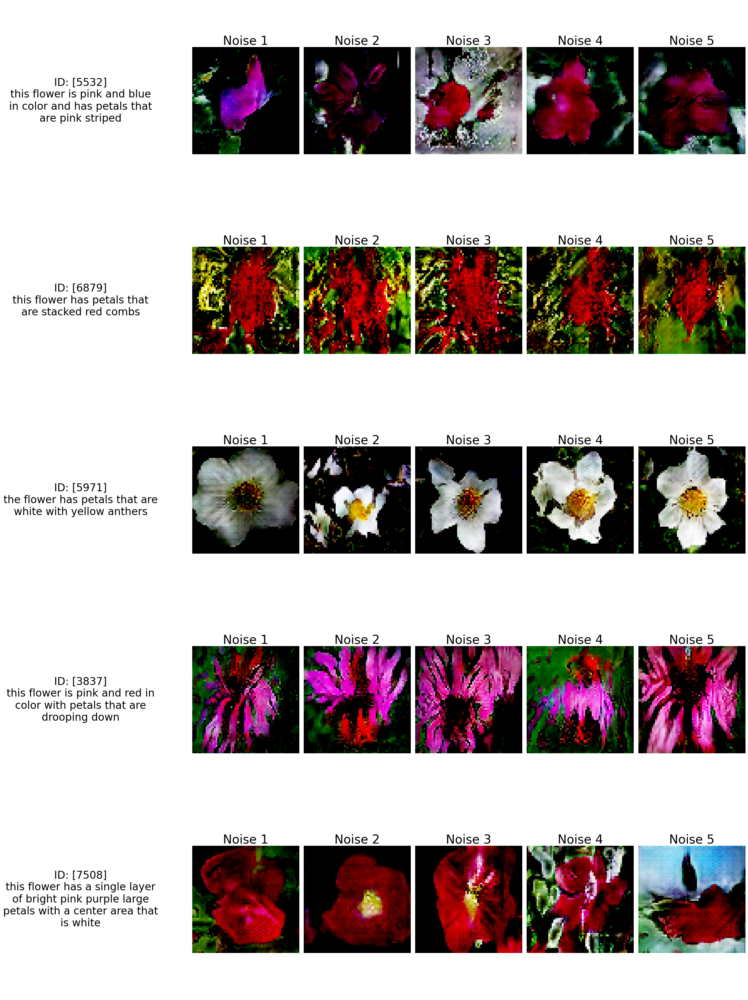

In [70]:
import matplotlib.gridspec as gridspec
import textwrap
# Assume batch_size = 1 and dataset is already created
batch_size = 1
dataset = testing_dataset_generator(batch_size, testing_data_generator)

# Load the mappings for decoding captions
##id2Word = np.load('/media/dala/SD480G/comp3/dataset/dictionary/id2Word.npy', allow_pickle=True)
#word2Id = np.load('/media/dala/SD480G/comp3/dataset/dictionary/word2Id.npy', allow_pickle=True)

data = pd.read_pickle('/media/dala/SD480G/comp3/dataset/dataset/testData.pkl')
captions = data['Captions'].values
#print(id2Word)

# Function to decode caption indices to words

# Create a plot
fig, axes = plt.subplots(nrows=5, ncols=6, figsize=(24, 32))
spec = gridspec.GridSpec(nrows=5, ncols=6, width_ratios=[4, 8, 8, 8, 8, 8])

def wrap_text(text, width=30):
    return "\n".join(textwrap.wrap(text, width))

# Shuffle and take 5 random samples
random_samples = dataset.shuffle(buffer_size=1000).take(5)
for i, sample in enumerate(random_samples):
    index, caption = sample
    s_caption = data[data['ID'] == index.numpy()[0]]['Captions'].values[0]
    print(s_caption)
    caption_text = sent2WordList(s_caption)  # Decode the first (and only) caption in the batch

    print(f"Processing ID: {index.numpy()}, Caption: {caption_text}")
    wrapped_caption = wrap_text(f"{caption_text}", width=30)
    formatted_text = f"ID: [{index.numpy()[0]}]\n{wrapped_caption}"
    
    # Display the ID and caption in the first column
    axes[i, 0].text(0, 0.5, formatted_text, 
                ha='center', va='center', fontsize=24)
    axes[i, 0].axis('off')

    for noise_id in range(5):  # Generate 5 images for each caption
        # Create a random noise vector
        input_g = tf.random.normal([1, Z_DIM])

        # Generate fake image using the generator
        fake_img = generator(caption, input_g, training=False)

        # Convert the generated image to a NumPy array
        img = np.clip(fake_img[0].numpy(), 0.0, 1.0)

        # Display the generated image in the corresponding column
        axes[i, noise_id + 1].imshow(img)
        axes[i, noise_id + 1].axis('off')
        axes[i, noise_id + 1].set_title(f"Noise {noise_id + 1}", fontsize=28)

# Adjust layout
plt.tight_layout()
plt.show()